# 🔍 Azure AutoML for Images (Object Detection)
## 4. ONNX edge inferencing

![Alt text](img/img.jpg)

This notebook demonstrates AutoML for Object Detection with ONNX edge inferencing. It is designed for running inference on object detection models using ONNX Runtime and integrates with Azure Machine Learning SDK v2 and MLflow for experiment tracking.
Key Features

- Loads ONNX models for object detection.
- Preprocesses input images.
- Performs inference and outputs predictions.
- Supports visualization of bounding boxes and results.

Ideal for deploying object detection models on edge devices using ONNX for efficient inference, while leveraging Azure ML for model management and MLflow for tracking.

In [1]:
import datetime
import glob
import json
import matplotlib.image as mpimg
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import mlflow
import numpy as np
import onnxruntime
import os
import platform
import psutil
import shutil
import sys
import time
import torch

from azure.ai.ml import MLClient
from azure.identity import DefaultAzureCredential
from dotenv import load_dotenv
from mlflow.tracking.client import MlflowClient
from PIL import Image, ImageDraw, ImageFont
from utils.yolo_onnx_preprocessing_utils import non_max_suppression, _convert_to_rcnn_output, preprocess

/anaconda/envs/azureml_py310_sdkv2/lib/python3.10/site-packages/pydantic/_internal/_config.py:373: UserWarning: Valid config keys have changed in V2:
* 'schema_extra' has been renamed to 'json_schema_extra'
  warnings.warn(message, UserWarning)


In [2]:
sys.version

'3.10.18 (main, Jun  5 2025, 13:14:17) [GCC 11.2.0]'

In [3]:
print(f"Today is {datetime.datetime.today().strftime('%d-%b-%Y %H:%M:%S')}")

Today is 29-Oct-2025 15:30:40


In [4]:
processor = platform.processor()
cpu_count = psutil.cpu_count(logical=True)
ram_total = round(psutil.virtual_memory().total / (1024 ** 3), 2)
ram_available = round(psutil.virtual_memory().available / (1024 ** 3), 2)

disk_total, disk_used, disk_free = shutil.disk_usage("/")
disk_total_gb = disk_total / (1024 ** 3)
disk_free_gb = disk_free / (1024 ** 3)
disk_free_percent = disk_free / disk_total

print(f"🖥️ Processor: {processor}")
print(f"🧠 CPU Cores: {cpu_count}")
print(f"💾 RAM Total: {ram_total} GB")
print(f"📗 RAM Available: {ram_available} GB")
print(f"📀 Disk Total: {disk_total_gb:.2f} GB")
print(f"📂 Disk Free: {disk_free_gb:.2f} GB ({disk_free_percent:.0%})")

🖥️ Processor: x86_64
🧠 CPU Cores: 48
💾 RAM Total: 188.88 GB
📗 RAM Available: 182.79 GB
📀 Disk Total: 118.05 GB
📂 Disk Free: 39.59 GB (34%)


## 1. Settings

In [5]:
ONNX_DIR = "onnx"

os.makedirs(ONNX_DIR, exist_ok=True)

In [6]:
load_dotenv("azure.env")

credential = DefaultAzureCredential()

ml_client = MLClient(
    credential=credential,
    subscription_id=os.getenv("subscription_id"),
    resource_group_name=os.getenv("resource_group"),
    workspace_name=os.getenv("workspace"),
)

In [7]:
job_name = "gifted_lock_rk5fjt8v49"  # Name of the Azure AutoML jobname to use

## 2. Helper

In [8]:
def get_predictions_from_ONNX(onnx_session, img_data):
    """
    Run inference using an ONNX Runtime session and return predictions.

    Parameters
    ----------
    onnx_session : onnxruntime.InferenceSession
        An active ONNX Runtime inference session loaded with a model.
    img_data : numpy.ndarray or compatible type
        Preprocessed input data matching the model's expected input shape.

    Returns
    -------
    numpy.ndarray
        The prediction results from the ONNX model for the given input data.
    """
    sess_input = onnx_session.get_inputs()
    sess_output = onnx_session.get_outputs()

    # predict with ONNX Runtime
    output_names = [output.name for output in sess_output]
    pred = onnx_session.run(output_names=output_names,
                            input_feed={sess_input[0].name: img_data})

    return pred[0]

In [9]:
def _get_box_dims(image_shape, box):
    """
    Normalize bounding box coordinates based on image dimensions.

    Parameters
    ----------
    image_shape : tuple of int
        Shape of the image as (height, width). Used to scale coordinates.
    box : iterable of numeric
        Bounding box coordinates in the format [topX, topY, bottomX, bottomY].
        Each element should be convertible to a scalar (e.g., tensor or numpy value).

    Returns
    -------
    dict
        A dictionary with normalized bounding box coordinates:
        {
            'topX': float,
            'topY': float,
            'bottomX': float,
            'bottomY': float
        }
        Values are scaled to the range [0, 1] relative to image width and height.
    """
    box_keys = ['topX', 'topY', 'bottomX', 'bottomY']
    height, width = image_shape[0], image_shape[1]
    box_dims = dict(zip(box_keys, [coordinate.item() for coordinate in box]))
    box_dims['topX'] = box_dims['topX'] * 1.0 / width
    box_dims['bottomX'] = box_dims['bottomX'] * 1.0 / width
    box_dims['topY'] = box_dims['topY'] * 1.0 / height
    box_dims['bottomY'] = box_dims['bottomY'] * 1.0 / height

    return box_dims

In [10]:
def _get_prediction(label, image_shape, classes):
    """
    Convert raw detection output into a structured list of bounding box predictions.

    Parameters
    ----------
    label : dict
        Dictionary containing detection results with keys:
        - "boxes": iterable of bounding box coordinates [topX, topY, bottomX, bottomY].
        - "labels": iterable of class indices (nested arrays or tensors).
        - "scores": iterable of confidence scores (nested arrays or tensors).
    image_shape : tuple of int
        Shape of the image as (height, width). Used for normalizing box coordinates.
    classes : list of str
        List of class names where index corresponds to label index.

    Returns
    -------
    list of dict
        A list of prediction records, each with:
        {
            'box': dict of normalized coordinates {'topX', 'topY', 'bottomX', 'bottomY'},
            'label': str,  # class name
            'score': float  # confidence score
        }
    """
    boxes = np.array(label["boxes"])
    labels = np.array(label["labels"])
    labels = [label[0] for label in labels]
    scores = np.array(label["scores"])
    scores = [score[0] for score in scores]
    bounding_boxes = []

    for box, label_index, score in zip(boxes, labels, scores):
        box_dims = _get_box_dims(image_shape, box)
        box_record = {
            'box': box_dims,
            'label': classes[label_index],
            'score': score.item()
        }
        bounding_boxes.append(box_record)

    return bounding_boxes

In [11]:
def visualize_detections(img_np,
                         image_boxes,
                         figsize=(10, 10),
                         box_color='lime',
                         text_color='lime',
                         line_width=3,
                         font_size=10,
                         confidence_threshold=0.5):
    """
    Visualize object detection bounding boxes on an image.
    
    Args:
        img_np: Image as numpy array (HxWxC)
        image_boxes: List of detection dictionaries with 'label', 'box', and 'score'
        figsize: Figure size tuple
        box_color: Color for bounding box edges
        text_color: Color for text labels
        line_width: Width of bounding box lines
        font_size: Font size for text labels
        confidence_threshold: Only show detections above this score
    """
    fig, ax = plt.subplots(1, figsize=figsize)
    ax.imshow(img_np)
    ax.axis('off')

    h, w = img_np.shape[:2]
    idx = 1

    if len(image_boxes) == 0:
        print("❌ No detected swimming pools in the image")

    for detect in image_boxes:
        score = detect.get('score', 0)

        if score < confidence_threshold:
            continue

        label = detect['label']
        box = detect['box']

        # Normalize box coordinates
        ymin, xmin, ymax, xmax = box['topY'], box['topX'], box['bottomY'], box[
            'bottomX']

        # Convert to pixel coordinates
        x_min_px = w * xmin
        y_min_px = h * ymin
        box_width = w * (xmax - xmin)
        box_height = h * (ymax - ymin)

        # Draw bounding box
        rect = patches.Rectangle((x_min_px, y_min_px),
                                 box_width,
                                 box_height,
                                 linewidth=line_width,
                                 edgecolor=box_color,
                                 facecolor='none')
        ax.add_patch(rect)

        # Add label with background for better readability
        label_text = f"{label} = {score:.3f}"

        # Add semi-transparent background behind text
        bbox_props = dict(boxstyle='round,pad=0.5',
                          facecolor='black',
                          alpha=0.7,
                          edgecolor=box_color,
                          linewidth=1)
        ax.text(
            x_min_px,
            y_min_px - 8,  # Position above the box
            label_text,
            color=text_color,
            fontsize=font_size,
            weight='bold',
            bbox=bbox_props,
            verticalalignment='bottom')

        print(
            f'{idx:03}: {label.upper()} with score = {score:.3f} | Bounding box: x={x_min_px}, y={y_min_px}, '
            f'w={box_width}, h={box_height}')
        idx += 1
        
    if len(image_boxes) > 0:
        print(f"\n✅ {len(image_boxes)} detected swimming pools in the image")
        print(f"✅ {idx-1} swimming pools with score >= {confidence_threshold}")
        
    plt.tight_layout()
    return fig, ax

## 3. MLFlow client

In [12]:
mlflow_client = MlflowClient()

# Obtain the tracking URL from MLClient
MLFLOW_TRACKING_URI = ml_client.workspaces.get(
    name=ml_client.workspace_name).mlflow_tracking_uri
mlflow.set_tracking_uri(MLFLOW_TRACKING_URI)

mlflow_parent_run = mlflow_client.get_run(job_name)
print(f"🏃 MLFlow AutoML parent run:\n\n{mlflow_parent_run}")

🏃 MLFlow AutoML parent run:

<Run: data=<RunData: metrics={'log_loss_train': 0.5006329404567581,
 'mean_average_precision': 0.95837,
 'mean_average_precision_train': 0.97227,
 'precision': 0.86335,
 'precision_train': 0.87609,
 'recall': 0.97024,
 'recall_train': 0.97958}, params={}, tags={'author': 'Serge Retkowsky',
 'automl_best_child_run_id': 'gifted_lock_rk5fjt8v49_HD_0',
 'cloud provider': 'Microsoft Azure',
 'data source': 'https://www.kaggle.com/alexj21/swimming-pool-512x512',
 'date': 'October 2025',
 'department': 'Data science',
 'fit_time_000': 'NaN',
 'is_gpu': 'True',
 'iteration_000': '0',
 'mlflow.rootRunId': 'gifted_lock_rk5fjt8v49',
 'mlflow.runName': 'gifted_lock_rk5fjt8v49',
 'mlflow.user': 'Serge Retkowsky',
 'model_explain_run': 'best_run',
 'pipeline_id_000': 'UnkownPipelineId',
 'predicted_cost_000': '0',
 'run_algorithm_000': '',
 'run_preprocessor_000': '',
 'score_000': '0.96311',
 'tools': 'AutoML for images Azure ML',
 'topic': 'Images object detection',
 '

In [13]:
mlflow_parent_run = mlflow_client.get_run(job_name)
best_child_run_id = mlflow_parent_run.data.tags['automl_best_child_run_id']

# get the best child run
best_run = mlflow_client.get_run(best_child_run_id)

## 4. Downloading labels & ONNX Model

### Labels file

In [14]:
labels_file = mlflow_client.download_artifacts(best_run.info.run_id,
                                               "train_artifacts/labels.json",
                                               ONNX_DIR)

In [15]:
labels_file = os.path.join(ONNX_DIR, "train_artifacts", "labels.json")

In [16]:
!ls $labels_file -lh

-rwxrwxrwx 1 root root 8 Oct 29 15:30 onnx/train_artifacts/labels.json


In [17]:
with open(labels_file) as f:
    classes = json.load(f)

print(classes)

['pool']


### ONNX file

In [18]:
onnx_model_path = mlflow_client.download_artifacts(
    best_run.info.run_id, "train_artifacts/model.onnx", ONNX_DIR)

In [19]:
onnx_model_path = os.path.join(ONNX_DIR, "train_artifacts", "model.onnx")

In [20]:
!ls $onnx_model_path -lh

-rwxrwxrwx 1 root root 83M Oct 29 15:30 onnx/train_artifacts/model.onnx


## 5. Creating a ONNX session

In [21]:
!ls $onnx_model_path -lh

-rwxrwxrwx 1 root root 83M Oct 29 15:30 onnx/train_artifacts/model.onnx


In [22]:
!ls $labels_file -lh

-rwxrwxrwx 1 root root 8 Oct 29 15:30 onnx/train_artifacts/labels.json


In [23]:
try:
    session = onnxruntime.InferenceSession(onnx_model_path)
    print("✅ OK. ONNX model loaded.")

except Exception as e:
    print(f"❌ Error loading ONNX file: {e}")

✅ OK. ONNX model loaded.


In [24]:
# Get session inputs and outputs
inputs = session.get_inputs()
outputs = session.get_outputs()

print(f"Number of inputs: {len(inputs)}, Number of outputs: {len(outputs)}\n")

# Display input details
for idx, inp in enumerate(inputs):
    print(
        f"📥 [Input {idx}] Name: {inp.name}, Shape: {inp.shape}, Type: {inp.type}"
    )

print()

# Display output details
for idx, out in enumerate(outputs):
    print(
        f"📤 [Output {idx}] Name: {out.name}, Shape: {out.shape}, Type: {out.type}"
    )

Number of inputs: 1, Number of outputs: 4

📥 [Input 0] Name: input, Shape: ['batch', 3, 640, 640], Type: tensor(float)

📤 [Output 0] Name: output, Shape: ['batch', 'Concatoutput_dim_1', 'Concatoutput_dim_2'], Type: tensor(float)
📤 [Output 1] Name: onnx::Sigmoid_1392, Shape: ['Transposeonnx::Sigmoid_1392_dim_0', 3, 80, 80, 6], Type: tensor(float)
📤 [Output 2] Name: onnx::Sigmoid_1662, Shape: ['Transposeonnx::Sigmoid_1662_dim_0', 3, 40, 40, 6], Type: tensor(float)
📤 [Output 3] Name: onnx::Sigmoid_1930, Shape: ['Transposeonnx::Sigmoid_1930_dim_0', 3, 20, 20, 6], Type: tensor(float)


In [25]:
batch, channel, height_onnx, width_onnx = session.get_inputs()[0].shape
batch, channel, height_onnx, width_onnx

('batch', 3, 640, 640)

## 6. Using the ONNX model in batch mode

In [26]:
batch_size = 100

In [27]:
test_images_path = "test/*"

image_extensions = ["*.jpg", "*.jpeg", "*.png", "*.gif", "*.bmp", "*.tiff"]
test_image_files = []
for ext in image_extensions:
    test_image_files.extend(glob.glob(f"test/{ext}"))

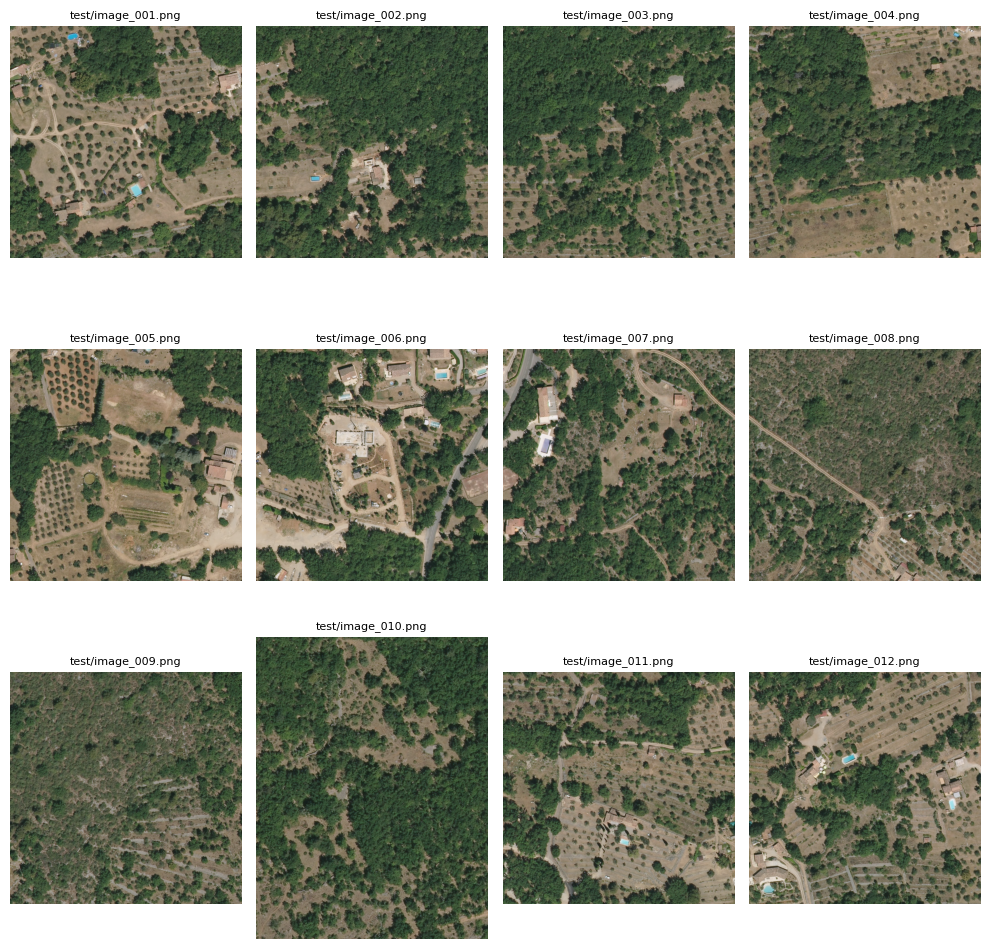

In [28]:
# Some tests images
fig, axes = plt.subplots(3, 4, figsize=(10, 10))
axes = axes.flatten()

for idx, image_file in enumerate(test_image_files[:12]):
    img = Image.open(image_file)
    axes[idx].imshow(img)
    axes[idx].axis('off')
    axes[idx].set_title(f"{image_file}", fontsize=8)

plt.tight_layout()
plt.show()

In [29]:
if not test_image_files:
    print("❌ No images found at the specified path")
    img_data = None

else:
    # Limit batch_size to available images
    actual_batch_size = min(batch_size, len(test_image_files))
    img_processed_list = []
    pad_list = []

    for i in range(actual_batch_size):
        img_processed, pad = preprocess(test_image_files[i])
        img_processed_list.append(img_processed)
        pad_list.append(pad)

    if len(img_processed_list) > 1:
        img_data = np.concatenate(img_processed_list)
    elif len(img_processed_list) == 1:
        img_data = img_processed_list[0]
    else:
        img_data = None

In [30]:
print("🤖 Running ONNX predictions on all the images files from the 'test' directory...")

start = time.time()

result = get_predictions_from_ONNX(session, img_data)

result_final = non_max_suppression(torch.from_numpy(result),
                                   conf_thres=0.1,
                                   iou_thres=0.5)

elapsed = time.time() - start
print(f"✅ Done in {elapsed:.3f} seconds for {len(img_data)} images")
avg_time = elapsed / len(img_data)
print(f"Average ONNX inference time per image = {avg_time:.3} seconds")

🤖 Running ONNX predictions on all the images files from the 'test' directory...
✅ Done in 16.749 seconds for 100 images
Average ONNX inference time per image = 0.167 seconds


### Results

In [31]:
bounding_boxes_batch = []

for result_i, pad in zip(result_final, pad_list):
    label, image_shape = _convert_to_rcnn_output(result_i, height_onnx,
                                                 width_onnx, pad)
    bounding_boxes_batch.append(_get_prediction(label, image_shape, classes))

🖼️ Image: test/image_001.png

001: POOL with score = 0.868 | Bounding box: x=529.166015625, y=695.33369140625, w=57.913281249999955, h=62.85292968750002
002: POOL with score = 0.825 | Bounding box: x=247.4662109375, y=26.75113525390625, w=59.673730468749994, h=36.54935302734375

✅ 2 detected swimming pools in the image
✅ 2 swimming pools with score >= 0.5


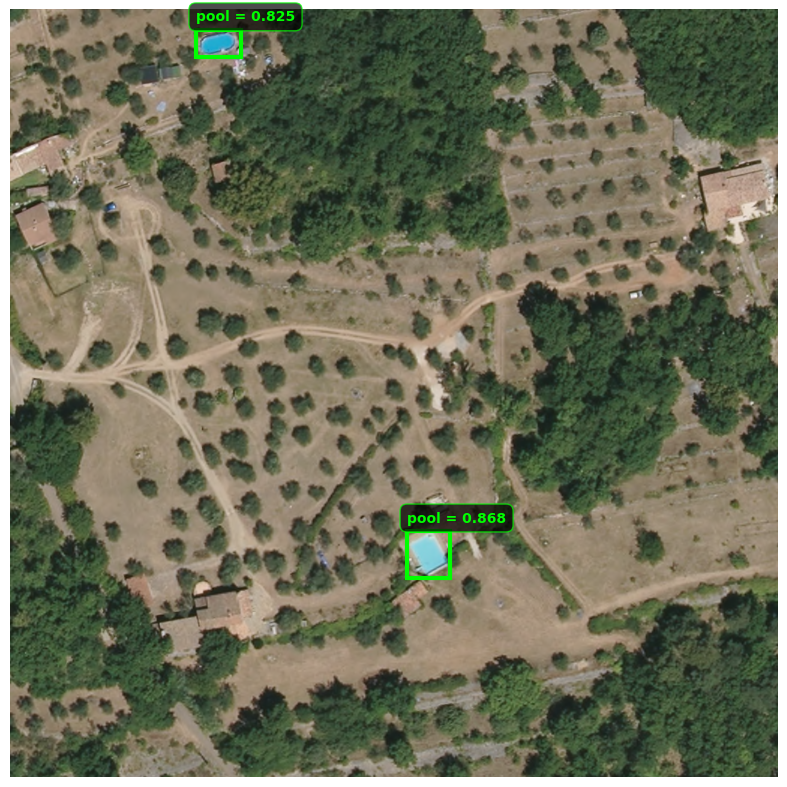

In [32]:
idx = 0

print(f"🖼️ Image: {test_image_files[idx]}\n")
fig, ax = visualize_detections(mpimg.imread(test_image_files[idx]),
                               bounding_boxes_batch[idx],
                               figsize=(8, 8))
plt.show()

🖼️ Image: test/image_011.png

001: POOL with score = 0.808 | Bounding box: x=512.391357421875, y=733.55341796875, w=54.81005859375, h=33.70576171875007
002: POOL with score = 0.640 | Bounding box: x=993.41708984375, y=655.625439453125, w=30.582910156250023, h=31.016992187500023

✅ 2 detected swimming pools in the image
✅ 2 swimming pools with score >= 0.5


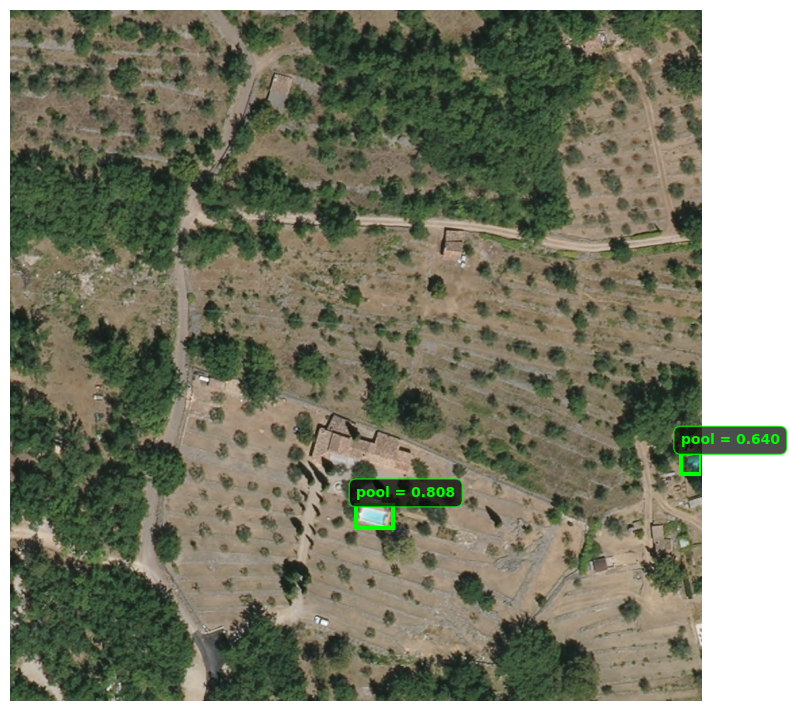

In [33]:
idx = 10

print(f"🖼️ Image: {test_image_files[idx]}\n")
fig, ax = visualize_detections(mpimg.imread(test_image_files[idx]),
                               bounding_boxes_batch[idx],
                               figsize=(8, 8))
plt.show()

🖼️ Image: test/image_021.png

001: POOL with score = 0.856 | Bounding box: x=558.867236328125, y=395.58486328125, w=72.9052734375, h=54.00107421874998
002: POOL with score = 0.785 | Bounding box: x=57.73326416015625, y=343.911279296875, w=66.314990234375, h=36.21616210937498

✅ 2 detected swimming pools in the image
✅ 2 swimming pools with score >= 0.5


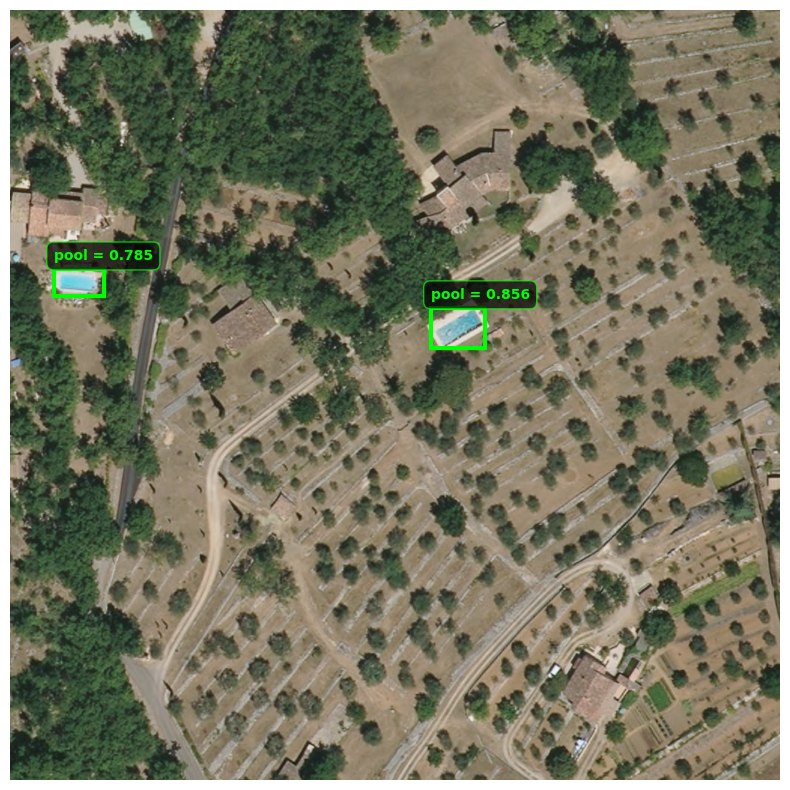

In [34]:
idx = 20

print(f"🖼️ Image: {test_image_files[idx]}\n")
fig, ax = visualize_detections(mpimg.imread(test_image_files[idx]),
                               bounding_boxes_batch[idx],
                               figsize=(8, 8))
plt.show()

🖼️ Image: test/image_031.png

001: POOL with score = 0.843 | Bounding box: x=491.247900390625, y=845.25078125, w=64.45908203124998, h=55.41679687499993

✅ 1 detected swimming pools in the image
✅ 1 swimming pools with score >= 0.7


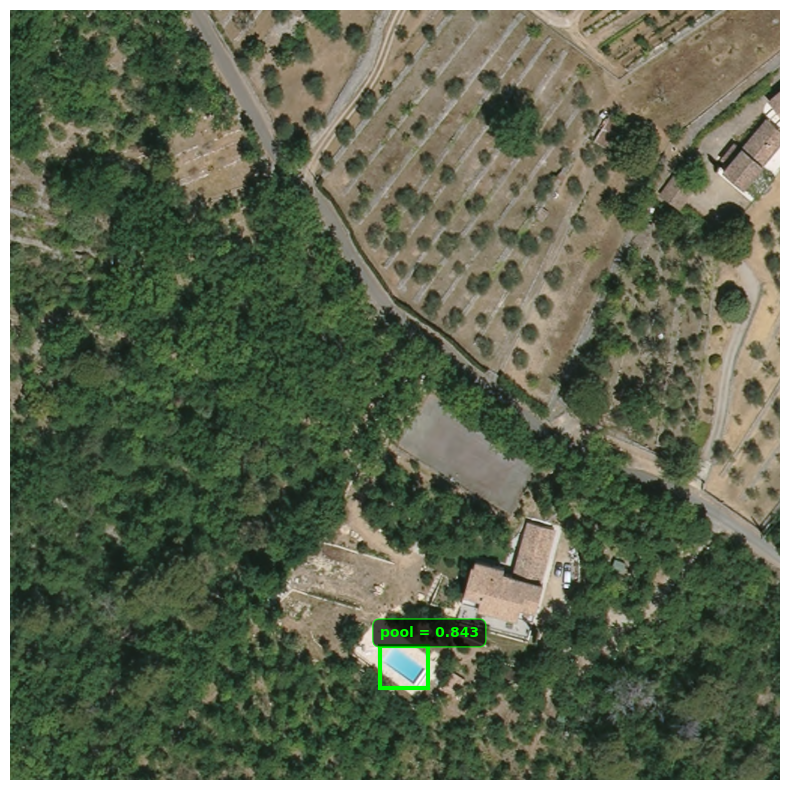

In [35]:
idx = 30

print(f"🖼️ Image: {test_image_files[idx]}\n")
fig, ax = visualize_detections(mpimg.imread(test_image_files[idx]),
                               bounding_boxes_batch[idx],
                               figsize=(8, 8),
                               confidence_threshold=0.7)
plt.show()

🖼️ Image: test/image_051.png

001: POOL with score = 0.864 | Bounding box: x=800.2134765625, y=60.134765625, w=74.94511718750005, h=54.053735351562494

✅ 1 detected swimming pools in the image
✅ 1 swimming pools with score >= 0.7


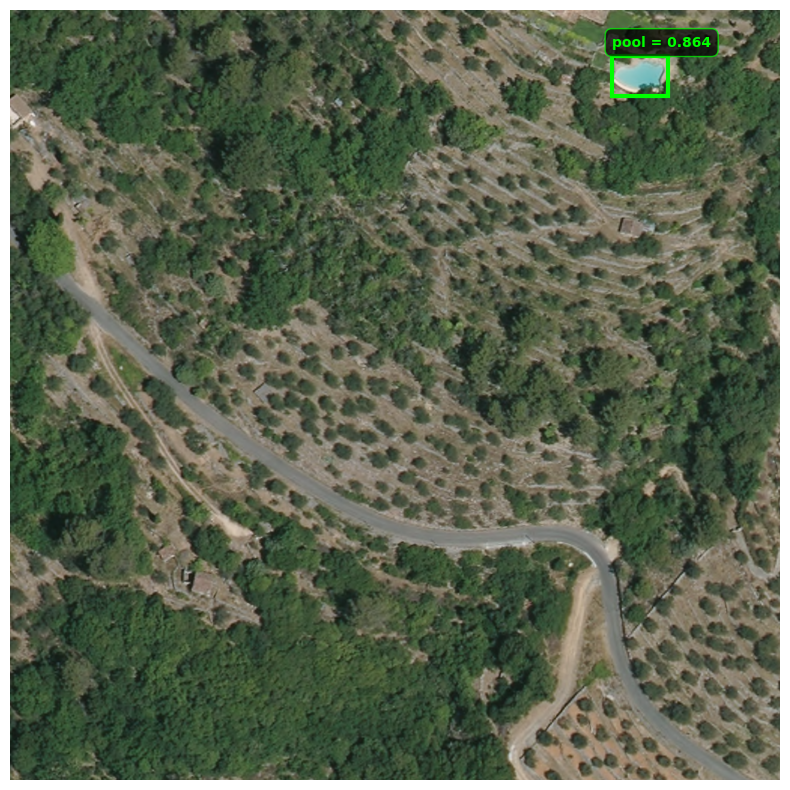

In [36]:
idx = 50

print(f"🖼️ Image: {test_image_files[idx]}\n")
fig, ax = visualize_detections(mpimg.imread(test_image_files[idx]),
                               bounding_boxes_batch[idx],
                               figsize=(8, 8),
                               confidence_threshold=0.7)
plt.show()

🖼️ Image: test/image_076.png

001: POOL with score = 0.869 | Bounding box: x=903.15224609375, y=298.0692626953125, w=85.013671875, h=51.46772460937501
002: POOL with score = 0.854 | Bounding box: x=529.592919921875, y=628.337451171875, w=69.95849609375, h=46.18369140624998
003: POOL with score = 0.852 | Bounding box: x=834.7388671875, y=931.1783203125, w=70.54296875, h=44.9755859375
004: POOL with score = 0.835 | Bounding box: x=836.29111328125, y=730.855224609375, w=70.2783203125, h=49.48544921874998
005: POOL with score = 0.817 | Bounding box: x=365.912548828125, y=320.743798828125, w=37.45166015625, h=60.707910156249966
006: POOL with score = 0.813 | Bounding box: x=158.70152587890624, y=375.7944580078125, w=81.54957275390626, h=45.14714355468749
007: POOL with score = 0.805 | Bounding box: x=843.8203125, y=95.65726318359376, w=78.923828125, h=48.606054687500006
008: POOL with score = 0.778 | Bounding box: x=496.26123046875, y=310.0552734375, w=68.64492187500002, h=43.24775390625001

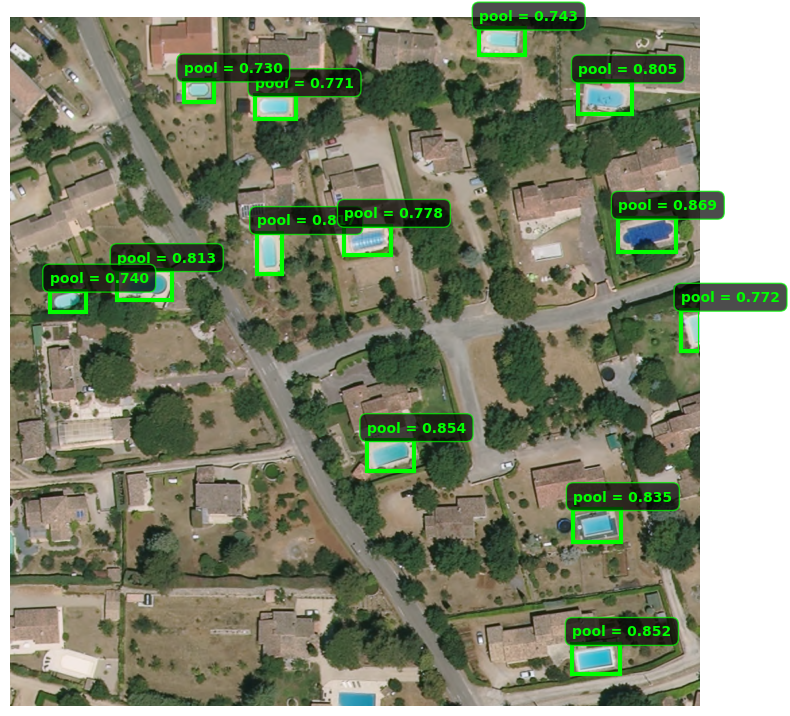

In [37]:
idx = 75

print(f"🖼️ Image: {test_image_files[idx]}\n")
fig, ax = visualize_detections(mpimg.imread(test_image_files[idx]),
                               bounding_boxes_batch[idx],
                               figsize=(8, 8),
                               confidence_threshold=0.7)
plt.show()

🖼️ Image: test/image_100.png

❌ No detected swimming pools in the image


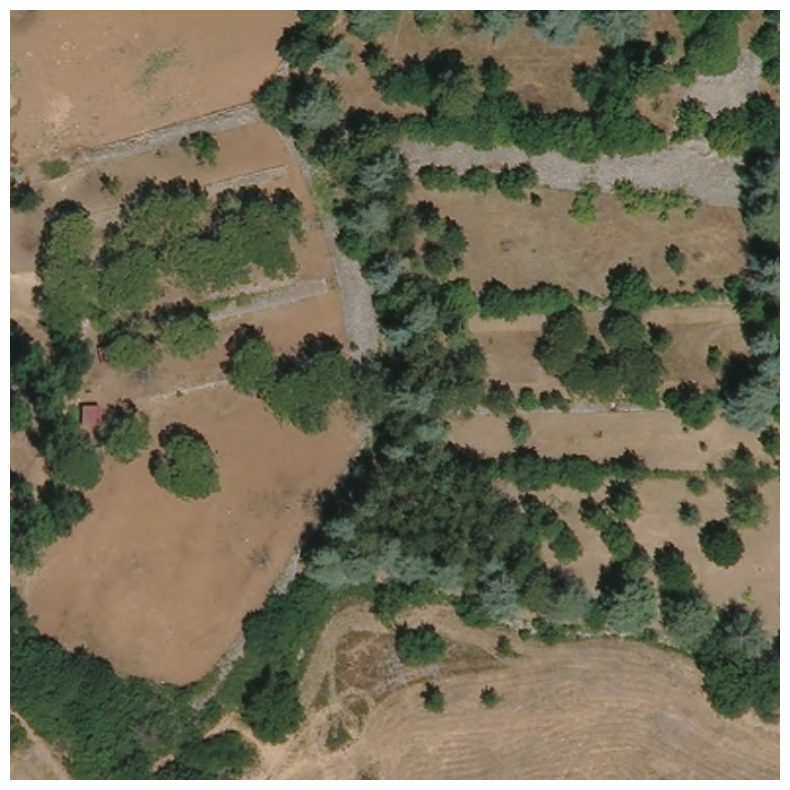

In [38]:
idx = 99

print(f"🖼️ Image: {test_image_files[idx]}\n")
fig, ax = visualize_detections(mpimg.imread(test_image_files[idx]),
                               bounding_boxes_batch[idx],
                               figsize=(8, 8),
                               confidence_threshold=0.3)
plt.show()

> End